In [75]:
import matplotlib.pyplot as plt
import numpy as np
from MieSppForce import force, frenel, dipoles
from tqdm import tqdm

In [76]:
from scipy.integrate import quad
c_const = 299792458

def get_intensity(wl, P, M, eps_Au):
    px, py, pz = P
    mx, my, mz = M
    ka = -1j * np.sqrt(1 / (eps_Au(wl) + 1))
    kspp = np.sqrt(eps_Au(wl) / (eps_Au(wl) + 1))
    return lambda phi: np.abs((mx / c_const + 1j * ka * py) * np.sin(phi) +
                              (my / c_const - 1j * ka * px) * np.cos(phi) - kspp * pz) ** 2
    
def directivity(wl, p, m, eps_Au):
    phi = np.linspace(0, 2 * np.pi, 100)
    intencity = get_intensity(wl, p, m, eps_Au)
    Imax = quad(intencity, 0, 2 * np.pi)[0]
    D = 2 * np.pi *intencity(phi) / Imax
    return phi, D



### Параметры

$\lambda$ | R, nm | a | $\delta \varphi$ | $\alpha$ |
----------|-------|---|------------------|----------|
600-900 nm | 50-120 nm | 0-1 | 0 | 25 deg |

In [22]:
from MieSppForce import green_func
wl=800
z0=45
eps_Au = frenel.get_interpolate('Au')
STOP=45
dyGE, dyGH = green_func.dy_green_E_H(wl, z0, eps_Au, stop=STOP)

print(np.imag(dyGE[1,2]))

1626769544070.1228


In [30]:
point=[0,0,z0]
eps_Si = frenel.get_interpolate('Si')
angle=25*np.pi/180
phase=0
a_angle = np.pi/4
R = 100

p,m = dipoles.calc_dipoles_v2(wl, eps_Au, point, R, eps_Si, angle, amplitude=1, phase=phase, a_angle=a_angle, stop=STOP)

print(np.arccos(np.real(np.conj(p[0,:])*m[2,:])/np.abs(p[0,:])/np.abs(m[2,:]))/np.pi)




[0.94900473]


In [34]:
dyrotGE, dyrotGH = green_func.dy_rot_green_E_H(wl,z0,eps_Au, stop=STOP)

/Users/semyon_b/git/SPP_ANALYTICAL/.venv/lib/python3.9/site-packages/scipy/integrate/_quadpack_py.py:446: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  re_retval = quad(refunc, a, b, args, full_output, epsabs,


In [36]:
print(np.real(dyrotGH[0,2]))
print(np.imag(dyrotGH[0,2]))

4.387945754907969e+19
1.0251328505941506e+19


In [32]:
print(np.real(np.conj(p[0,:])*m[2,:]))


[-7.55961477e-55]


In [25]:
# print(np.angle(p[1,:]))
# print(np.angle(p[2,:]))     
print((np.angle(np.conj(p[0,:])*m[2,:]))/np.pi)
#print((np.angle(p[1,:]) - np.angle(p[2,:]))/np.pi)

[-0.94900473]


In [44]:
eps_Si = frenel.get_interpolate('Si')
eps_Au = frenel.get_interpolate('Au')

R = 100
angle = 25*np.pi/180
a_angle = np.pi/4
# 0 - TM, pi/2 - TE
phase = 0
STOP = 45
wl = 800
dist = 2

#a = np.linspace(0, np.pi/2, 100)

R = np.linspace(30, 120, 30)

#R = np.linspace(60,120, 30)
P, M = np.empty((3, len(R)), dtype=complex), np.empty((3, len(R)), dtype=complex)
F_y = np.empty((8,len(R)))
F_x = np.empty_like(F_y)
F_z = np.empty_like(F_y)

for i in tqdm(range(len(R))):
    point = [0,0,R[i]+dist]
    p,m = dipoles.calc_dipoles_v2(wl, eps_Au, point, R[i], eps_Si, angle, amplitude=1, phase=phase, a_angle=a_angle, stop=STOP)
    p,m = p[:,0],m[:,0]
    P[:,i], M[:,i] = p,m
    f = force.F(wl, eps_Au, point, R[i], eps_Si, angle, amplitude=1, phase=phase, a_angle=a_angle, stop=STOP, full_output=True)
    F_y[:,i] = f[1]
    F_x[:,i] = f[0]
    F_z[:,i] = f[2]



100%|██████████| 30/30 [00:28<00:00,  1.05it/s]


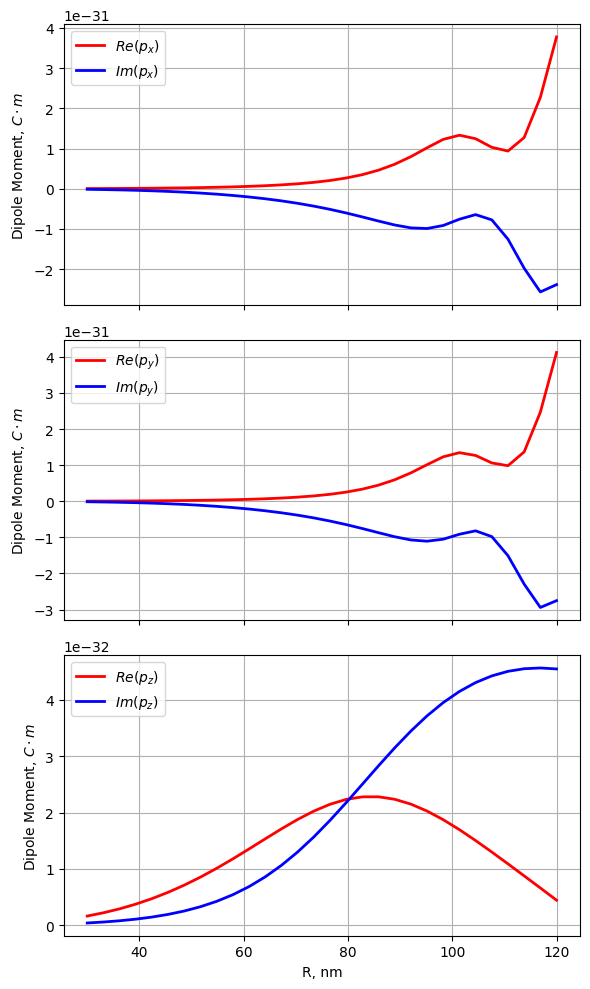

In [45]:
fig, axs = plt.subplots(3, 1, figsize=(6, 10), sharex=True)

axs[0].plot(R, np.real(P[0]), label='$Re(p_x)$', c='r', lw=2)
axs[0].plot(R, np.imag(P[0]), label='$Im(p_x)$', c='b', lw=2)
axs[0].set_ylabel('Dipole Moment, $C \cdot m$')
axs[0].legend()
axs[0].grid()

axs[1].plot(R, np.real(P[1]), label='$Re(p_y)$', c='r', lw=2)
axs[1].plot(R, np.imag(P[1]), label='$Im(p_y)$', c='b', lw=2)
axs[1].set_ylabel('Dipole Moment, $C \cdot m$')
axs[1].legend()
axs[1].grid()

axs[2].plot(R, np.real(P[2]), label='$Re(p_z)$', c='r', lw=2)
axs[2].plot(R, np.imag(P[2]), label='$Im(p_z)$', c='b', lw=2)
axs[2].set_xlabel('R, nm')
axs[2].set_ylabel('Dipole Moment, $C \cdot m$')
axs[2].legend()
axs[2].grid()

plt.tight_layout()
# plt.savefig('plots_new/electric_dipoles_from_a.pdf')
plt.show()

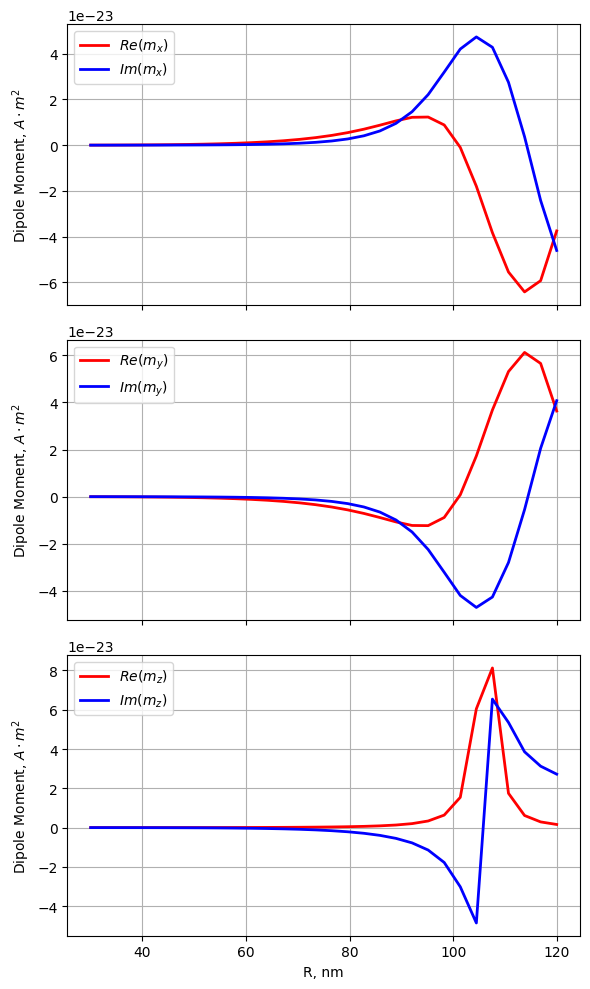

In [46]:
fig, axs = plt.subplots(3, 1, figsize=(6, 10), sharex=True)

axs[0].plot(R, np.real(M[0]), label='$Re(m_x)$', c='r', lw=2)
axs[0].plot(R, np.imag(M[0]), label='$Im(m_x)$', c='b', lw=2)
axs[0].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[0].legend()
axs[0].grid()

axs[1].plot(R, np.real(M[1]), label='$Re(m_y)$', c='r', lw=2)
axs[1].plot(R, np.imag(M[1]), label='$Im(m_y)$', c='b', lw=2)
axs[1].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[1].legend()
axs[1].grid()

axs[2].plot(R, np.real(M[2]), label='$Re(m_z)$', c='r', lw=2)
axs[2].plot(R, np.imag(M[2]), label='$Im(m_z)$', c='b', lw=2)
axs[2].set_xlabel('R, nm')
axs[2].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[2].legend()
axs[2].grid()

plt.tight_layout()
# plt.savefig('plots_new/magnetic_dipoles_from_a.pdf')
plt.show()

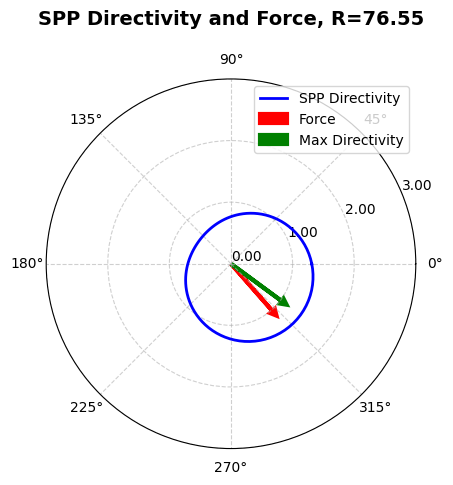

In [50]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ind = 15
PHI, D = directivity(wl, P[:, ind], M[:, ind], eps_Au)
ax.plot(PHI, D, label='SPP Directivity', color='blue', linewidth=2)
F_angle = np.arctan2(F_y[0, ind], F_x[0, ind])
max_idx = np.argmax(D)
phi_max = PHI[max_idx]
D_max = max(D)
F_mag_norm =  D_max 
ax.arrow(F_angle, 0, 0, F_mag_norm*0.8, 
         color='red', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Force')

ax.arrow(phi_max, 0, 0, D_max*0.8 , 
         color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')

ax.set_rticks([0, 1, 2, 3])  
ax.set_yticklabels([f"{0:.2f}", f"{1:.2f}", f"{2:.2f}", f"{3:.2f}"], fontsize=10)

ax.set_title(f'SPP Directivity and Force, R={round(R[ind],2)}', fontsize=14, fontweight='bold', pad=20)
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(loc='upper right')

plt.show()


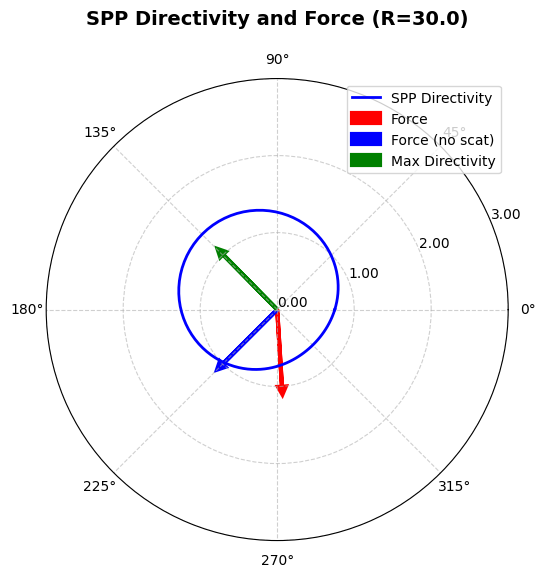

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, HTML
import os
from IPython.display import HTML

# Создаем фигуру и оси
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={'projection': 'polar'})  # Квадратный размер

# Функция обновления кадров
def update(ind):
    ax.clear()  # Очищаем оси перед обновлением

    PHI, D = directivity(wl, P[:, ind], M[:, ind], eps_Au)
    
    ax.plot(PHI, D, label='SPP Directivity', color='blue', linewidth=2)

    # Вычисляем угол и нормированную силу
    F_angle = np.arctan2(F_y[0, ind], F_x[0, ind])
    
    F_angle_no_scat = np.arctan2(F_y[2, ind]+F_y[3, ind]+F_y[5, ind]+F_y[6, ind]+F_y[7, ind], F_x[2, ind]+F_x[3, ind]+F_x[5, ind]+F_x[6, ind]+F_x[7, ind])
    max_idx = np.argmax(D)
    phi_max = PHI[max_idx]
    D_max = max(D)
    F_mag_norm = D_max * 0.8  # Пропорционально D_max

    # Добавляем стрелку силы (красную)
    ax.arrow(F_angle, 0, 0, F_mag_norm, 
             color='red', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Force')
    
    ax.arrow(F_angle_no_scat, 0, 0, F_mag_norm, 
             color='blue', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Force (no scat)')

    # Добавляем стрелку направления плазмона (зеленую)
    ax.arrow(phi_max, 0, 0, D_max * 0.8, 
             color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')

    # Настройки радиальных меток
    ax.set_rticks([0, 1, 2, 3])
    ax.set_yticklabels([f"{0:.2f}", f"{1:.2f}", f"{2:.2f}", f"{3:.2f}"], fontsize=10)

    ax.set_title(f'SPP Directivity and Force (R={round(R[ind],2)})', fontsize=14, fontweight='bold', pad=20)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(loc='upper right')

# Количество кадров (по количеству индексов)
num_frames = len(P[0, :])

# Создание анимации
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=200)  # Увеличен interval для плавности

# Сохранение в GIF с уменьшенной скоростью
gif_path = f"spp_directivity_R_{R}_z0_{round(dist,2)}_phase_{round(phase,2)}_from_a.gif"
#ani.save(gif_path, fps=5)  # fps=5 делает анимацию в 2 раза медленнее
HTML(ani.to_jshtml())



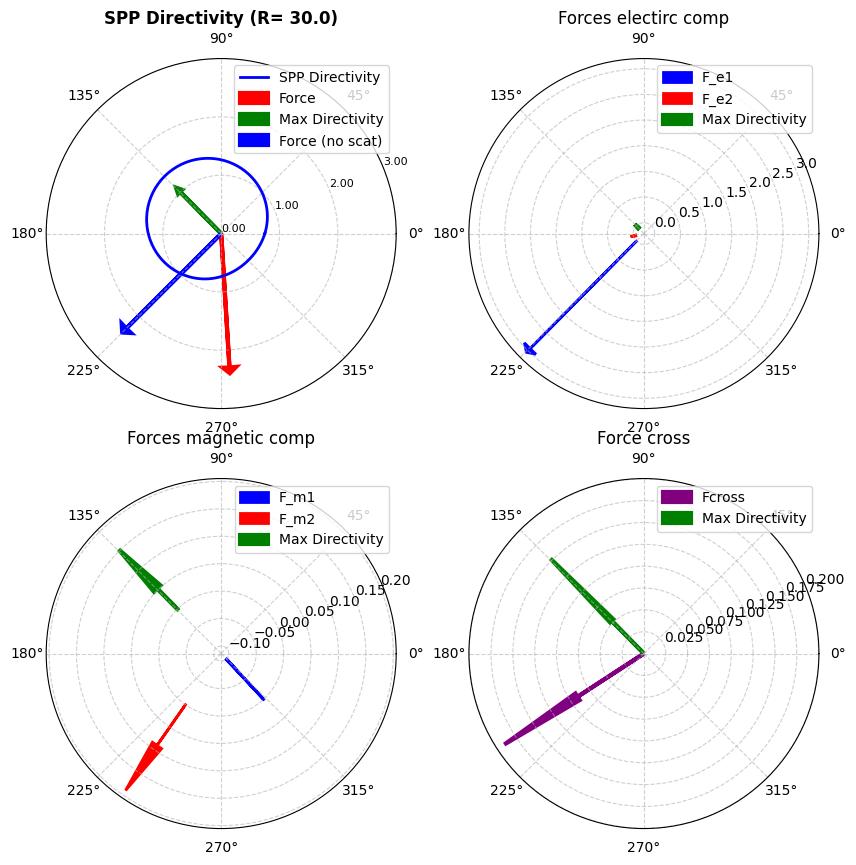

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Video
import os


fig, axs = plt.subplots(2, 2, figsize=(10, 10), subplot_kw={'projection': 'polar'})  
axs = axs.flatten() 

colors = ['black', 'blue', 'red']  


def update(ind):
    for ax in axs:
        ax.clear() 

    PHI, D = directivity(wl, P[:, ind], M[:, ind], eps_Au)

    axs[0].plot(PHI, D, label='SPP Directivity', color='blue', linewidth=2)

    F_angle = np.arctan2(F_y[0, ind], F_x[0, ind])
    Fnorm = np.sqrt(F_y[0, ind]**2 + F_x[0, ind]**2)
    max_idx = np.argmax(D)
    phi_max = PHI[max_idx]
    D_max = max(D)
    F_mag_norm = 3 * 0.8  # Пропорционально D_max
    F_angle_no_scat = np.arctan2(F_y[2, ind]+F_y[3, ind]+F_y[5, ind]+F_y[6, ind]+F_y[7, ind], F_x[2, ind]+F_x[3, ind]+F_x[5, ind]+F_x[6, ind]+F_x[7, ind])
    
    axs[0].arrow(F_angle, 0, 0, F_mag_norm, 
                 color='red', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Force')
    axs[0].arrow(phi_max, 0, 0, D_max * 0.8, 
                 color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')

    axs[0].set_title(f'SPP Directivity (R= {round(R[ind],2)})', fontsize=12, fontweight='bold')
    
    axs[0].arrow(F_angle_no_scat, 0, 0, F_mag_norm, 
             color='blue', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Force (no scat)')

    # График 1: силы F_[1-3]
    for i in range(2, 4):
        F_angle = np.arctan2(F_y[i, ind], F_x[i, ind])
        F_mag = np.sqrt(F_y[i, ind]**2 + F_x[i, ind]**2)
        axs[1].arrow(F_angle, 0, 0, F_mag/Fnorm*F_mag_norm, color=colors[i-1], linewidth=2, head_width=0.1, head_length=0.1, length_includes_head=True, label=f'F_e{i-1}')
    axs[1].arrow(phi_max, 0, 0, F_mag/Fnorm*F_mag_norm * 0.8, 
                 color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')

    axs[1].set_title('Forces electirc comp', fontsize=12)
    # График 2: силы F_[4-6]
    for i in range(5, 7):
        F_angle = np.arctan2(F_y[i, ind], F_x[i, ind])
        F_mag = np.sqrt(F_y[i, ind]**2 + F_x[i, ind]**2)
        axs[2].arrow(F_angle, 0, 0, F_mag/Fnorm*F_mag_norm, color=colors[i-4], linewidth=2, head_width=0.1, head_length=0.1, length_includes_head=True, label=f'F_m{i-4}')
    axs[2].arrow(phi_max, 0, 0, F_mag/Fnorm*F_mag_norm * 0.8, 
                 color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')

    axs[2].set_title('Forces magnetic comp', fontsize=12)

    # График 3: сила F_[7]
    F_angle = np.arctan2(F_y[7, ind], F_x[7, ind])
    F_mag = np.sqrt(F_y[i, ind]**2 + F_x[i, ind]**2)
    axs[3].arrow(F_angle, 0, 0, F_mag/Fnorm*F_mag_norm, color='purple', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Fcross')
    axs[3].arrow(phi_max, 0, 0, F_mag/Fnorm*F_mag_norm * 0.8, 
                 color='green', linewidth=3, head_width=0.1, head_length=0.1, length_includes_head=True, label='Max Directivity')
    axs[3].set_title('Force cross', fontsize=12)

    axs[0].set_rticks([0, 1, 2, 3])
    axs[0].set_yticklabels([f"{0:.2f}", f"{1:.2f}", f"{2:.2f}", f"{3:.2f}"], fontsize=8)
    # Настройки всех графиков
    for ax in axs:
        ax.grid(True, linestyle='--', alpha=0.6)
        ax.legend()

# Количество кадров (по количеству индексов)
num_frames = len(P[0, :])

# Создание анимации
ani = animation.FuncAnimation(fig, update, frames=num_frames, interval=200)  # Уменьшенная скорость

# Сохранение в GIF с уменьшенной скоростью
gif_path = f"spp_directivity_more_plots_R_{R}_z0_{dist}_phase_{phase}_from_a.gif"
#ani.save(gif_path, fps=15)  # fps=5 делает анимацию в 2 раза медленнее
HTML(ani.to_jshtml())


In [72]:
from MieSppForce import dipoles

R = 100
angle = 25*np.pi/180
a_angle = np.pi/4
phase = 0
STOP = 45
wl = 800

z0 = np.linspace(0,120,30)

c_const = 299792458
eps0_const = 1/(4*np.pi*c_const**2)*1e7

P0,M0 = np.empty((len(z0),3), dtype=complex), np.empty((len(z0), 3), dtype=complex)
P,M = np.empty_like(P0), np.empty_like(P0)

alpha_e, alpha_m = dipoles.alpha_v2(wl, R, eps_Si)

for i in tqdm(range(len(z0))):
    point = [0,0,z0[i]]
    E0,H0 = dipoles.initial_field(wl, angle, 1, eps_Au, point, phase, a_angle)
    P0[i,:], M0[i,:] = eps0_const*alpha_e*E0[0,:], alpha_m*H0[0,:]
    
    p,m = dipoles.calc_dipoles_v2(wl, eps_Au, point, R, eps_Si, angle, amplitude=1, phase=phase, a_angle=a_angle, stop=STOP)
    p,m = p[:,0],m[:,0]
    P[i,:], M[i,:] = p,m
    
    
    

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:00<00:00, 2629.93it/s]


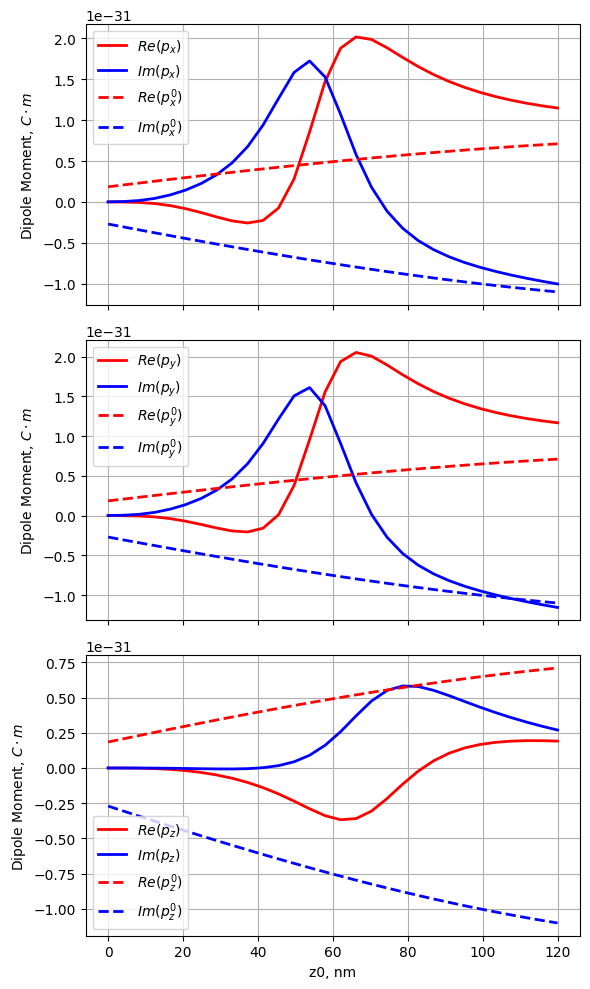

In [73]:
fig, axs = plt.subplots(3, 1, figsize=(6, 10), sharex=True)



axs[0].plot(z0, np.real(P[:,0]), label='$Re(p_x)$', c='r', lw=2)
axs[0].plot(z0, np.imag(P[:,0]), label='$Im(p_x)$', c='b', lw=2)

axs[0].plot(z0, np.real(P0[:,0]), label='$Re(p_x^0)$', c='r', lw=2, ls='--')
axs[0].plot(z0, np.imag(P0[:,0]), label='$Im(p_x^0)$', c='b', lw=2, ls='--')

axs[0].set_ylabel('Dipole Moment, $C \cdot m$')
axs[0].legend()
axs[0].grid()

axs[1].plot(z0, np.real(P[:,1]), label='$Re(p_y)$', c='r', lw=2)
axs[1].plot(z0, np.imag(P[:,1]), label='$Im(p_y)$', c='b', lw=2)
axs[1].plot(z0, np.real(P0[:,1]), label='$Re(p_y^0)$', c='r', lw=2, ls='--')
axs[1].plot(z0, np.imag(P0[:,1]), label='$Im(p_y^0)$', c='b', lw=2, ls='--')

axs[1].set_ylabel('Dipole Moment, $C \cdot m$')
axs[1].legend()
axs[1].grid()

axs[2].plot(z0, np.real(P[:,2]), label='$Re(p_z)$', c='r', lw=2)
axs[2].plot(z0, np.imag(P[:,2]), label='$Im(p_z)$', c='b', lw=2)
axs[2].plot(z0, np.real(P0[:,2]), label='$Re(p_z^0)$', c='r', lw=2, ls='--')
axs[2].plot(z0, np.imag(P0[:,2]), label='$Im(p_z^0)$', c='b', lw=2, ls='--')

axs[2].set_xlabel('z0, nm')
axs[2].set_ylabel('Dipole Moment, $C \cdot m$')
axs[2].legend()
axs[2].grid()

plt.tight_layout()
#plt.savefig('plots_new/electric_dipoles_from_z0.pdf')
plt.show()

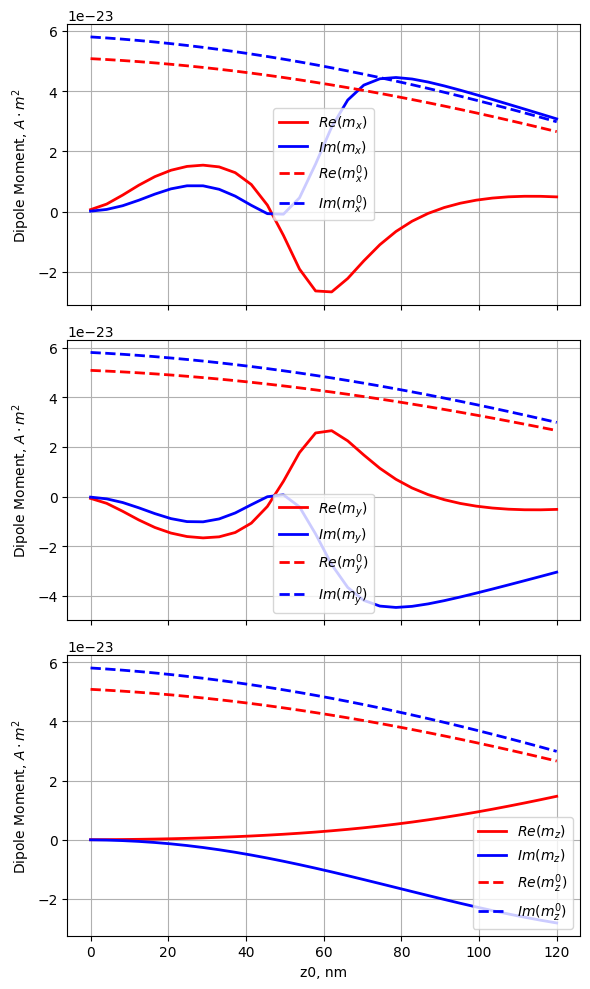

In [74]:
fig, axs = plt.subplots(3, 1, figsize=(6, 10), sharex=True)

axs[0].plot(z0, np.real(M[:,0]), label='$Re(m_x)$', c='r', lw=2)
axs[0].plot(z0, np.imag(M[:,0]), label='$Im(m_x)$', c='b', lw=2)

axs[0].plot(z0, np.real(M0[:,0]), label='$Re(m_x^0)$', c='r', lw=2, ls='--')
axs[0].plot(z0, np.imag(M0[:,0]), label='$Im(m_x^0)$', c='b', lw=2, ls='--')

axs[0].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[0].legend()
axs[0].grid()

axs[1].plot(z0, np.real(M[:,1]), label='$Re(m_y)$', c='r', lw=2)
axs[1].plot(z0, np.imag(M[:,1]), label='$Im(m_y)$', c='b', lw=2)
axs[1].plot(z0, np.real(M0[:,1]), label='$Re(m_y^0)$', c='r', lw=2, ls='--')
axs[1].plot(z0, np.imag(M0[:,1]), label='$Im(m_y^0)$', c='b', lw=2, ls='--')

axs[1].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[1].legend()
axs[1].grid()

axs[2].plot(z0, np.real(M[:,2]), label='$Re(m_z)$', c='r', lw=2)
axs[2].plot(z0, np.imag(M[:,2]), label='$Im(m_z)$', c='b', lw=2)
axs[2].plot(z0, np.real(M0[:,2]), label='$Re(m_z^0)$', c='r', lw=2, ls='--')
axs[2].plot(z0, np.imag(M0[:,2]), label='$Im(m_z^0)$', c='b', lw=2, ls='--')

axs[2].set_xlabel('z0, nm')
axs[2].set_ylabel('Dipole Moment, $A \cdot m^2$')
axs[2].legend()
axs[2].grid()

plt.tight_layout()
#plt.savefig('plots_new/magnetic_dipoles_from_a.pdf')
plt.show()